<a href="https://colab.research.google.com/github/katearb/ipynb-projects/blob/master/w6_Outliers.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

from scipy.stats import chi2
from scipy.spatial.distance import mahalanobis

from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.feature_selection import VarianceThreshold
from sklearn.preprocessing import FunctionTransformer
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import IsolationForest
from sklearn.svm import OneClassSVM

np.random.seed(0)

In [ ]:
import warnings
warnings.filterwarnings('ignore')

In [ ]:
data = pd.read_csv('https://raw.githubusercontent.com/katearb/files/main/Cardiotocography.csv')

In [ ]:
data

,id,LB,AC,FM,UC,ASTV,MSTV,ALTV,MLTV,DL,DS,DP,Width,Min,Max,Nmax,Nzeros,Mode,Mean,Median,Variance,Tendency,outlier
0,1881.0,0.592593,0.000000,0.000000,0.294118,0.633803,0.338235,0.000000,0.013807,0.500000,0.0,0.000000,0.595376,0.045872,0.336207,0.333333,0.1,0.485149,0.247423,0.284091,0.638418,1.0,b'yes'
1,421.0,0.574074,0.038462,0.000000,0.000000,0.816901,0.029412,0.527473,0.092702,0.000000,0.0,0.000000,0.364162,0.770642,0.672414,0.166667,0.0,0.534653,0.587629,0.511364,0.016949,0.0,b'yes'
2,92.0,0.777778,0.000000,0.000000,0.000000,0.774648,0.029412,0.736264,0.096647,0.000000,0.0,0.000000,0.069364,0.816514,0.275862,0.222222,0.0,0.633663,0.659794,0.602273,0.000000,1.0,b'yes'
3,1767.0,0.259259,0.000000,0.000000,0.294118,0.704225,0.191176,0.000000,0.183432,0.428571,0.0,0.333333,0.473988,0.174312,0.275862,0.222222,0.1,0.000000,0.164948,0.000000,0.361582,0.0,b'yes'
4,1880.0,0.592593,0.000000,0.001773,0.294118,0.633803,0.352941,0.000000,0.013807,0.428571,0.0,0.333333,0.595376,0.045872,0.336207,0.333333,0.1,0.485149,0.226804,0.272727,0.683616,1.0,b'yes'
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16875,2118.0,0.629630,0.000000,0.000000,0.352941,0.893333,0.014706,0.253165,0.167653,0.000000,0.0,0.000000,0.096386,0.678899,0.241379,0.055556,0.0,0.641667,0.642202,0.563830,0.005650,1.0,b'no'
16876,2119.0,0.629630,0.000000,0.000000,0.411765,0.893333,0.044118,0.329114,0.138067,0.071429,0.0,0.000000,0.066265,0.724771,0.241379,0.055556,0.0,0.650000,0.633028,0.563830,0.011299,1.0,b'no'
16877,2120.0,0.629630,0.000000,0.000000,0.352941,0.893333,0.058824,0.341772,0.126233,0.071429,0.0,0.000000,0.096386,0.678899,0.241379,0.055556,0.0,0.641667,0.623853,0.563830,0.005650,1.0,b'no'
16878,2121.0,0.629630,0.000000,0.000000,0.235294,0.866667,0.073529,0.215190,0.118343,0.071429,0.0,0.000000,0.126506,0.678899,0.284483,0.111111,0.0,0.650000,0.642202,0.563830,0.011299,0.5,b'no'


In [ ]:
data[data['id'].duplicated()]

,id,LB,AC,FM,UC,ASTV,MSTV,ALTV,MLTV,DL,DS,DP,Width,Min,Max,Nmax,Nzeros,Mode,Mean,Median,Variance,Tendency,outlier
1695,292.0,0.666667,0.000000,0.012411,0.000000,0.653333,0.073529,0.577778,0.240631,0.000000,0.0,0.000000,0.412791,0.192661,0.241379,0.666667,0.0,0.633333,0.615385,0.575758,0.016949,1.0,b'yes'
1704,290.0,0.703704,0.000000,0.001773,0.000000,0.840000,0.014706,0.644444,0.078895,0.000000,0.0,0.000000,0.011628,0.862385,0.275862,0.111111,0.0,0.700000,0.692308,0.656566,0.000000,1.0,b'yes'
1710,29.0,0.481481,0.000000,0.287234,0.058824,0.226667,0.617647,0.000000,0.207101,0.714286,0.0,0.333333,0.773256,0.000000,0.594828,0.388889,0.1,0.550000,0.394231,0.424242,0.412429,0.5,b'yes'
1721,2.0,0.481481,0.153846,0.000000,0.235294,0.066667,0.279412,0.000000,0.205128,0.142857,0.0,0.000000,0.709302,0.165138,0.655172,0.333333,0.1,0.616667,0.557692,0.535354,0.067797,0.5,b'no'
1722,3.0,0.500000,0.076923,0.000000,0.294118,0.053333,0.279412,0.000000,0.264300,0.142857,0.0,0.000000,0.709302,0.165138,0.655172,0.277778,0.1,0.616667,0.548077,0.515152,0.073446,0.5,b'no'
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16875,2118.0,0.629630,0.000000,0.000000,0.352941,0.893333,0.014706,0.253165,0.167653,0.000000,0.0,0.000000,0.096386,0.678899,0.241379,0.055556,0.0,0.641667,0.642202,0.563830,0.005650,1.0,b'no'
16876,2119.0,0.629630,0.000000,0.000000,0.411765,0.893333,0.044118,0.329114,0.138067,0.071429,0.0,0.000000,0.066265,0.724771,0.241379,0.055556,0.0,0.650000,0.633028,0.563830,0.011299,1.0,b'no'
16877,2120.0,0.629630,0.000000,0.000000,0.352941,0.893333,0.058824,0.341772,0.126233,0.071429,0.0,0.000000,0.096386,0.678899,0.241379,0.055556,0.0,0.641667,0.623853,0.563830,0.005650,1.0,b'no'
16878,2121.0,0.629630,0.000000,0.000000,0.235294,0.866667,0.073529,0.215190,0.118343,0.071429,0.0,0.000000,0.126506,0.678899,0.284483,0.111111,0.0,0.650000,0.642202,0.563830,0.011299,0.5,b'no'


ID column cannot be an index column as it contains duplicates, so I just drop it.

In [ ]:
data.drop('id', axis=1, inplace=True)

In [ ]:
X = data.iloc[:, :-1]
y = data.iloc[:, -1]

# EDA

In [ ]:
# general info
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16880 entries, 0 to 16879
Data columns (total 22 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   LB        16880 non-null  float64
 1   AC        16880 non-null  float64
 2   FM        16880 non-null  float64
 3   UC        16880 non-null  float64
 4   ASTV      16880 non-null  float64
 5   MSTV      16880 non-null  float64
 6   ALTV      16880 non-null  float64
 7   MLTV      16880 non-null  float64
 8   DL        16880 non-null  float64
 9   DS        16880 non-null  float64
 10  DP        16880 non-null  float64
 11  Width     16880 non-null  float64
 12  Min       16880 non-null  float64
 13  Max       16880 non-null  float64
 14  Nmax      16880 non-null  float64
 15  Nzeros    16880 non-null  float64
 16  Mode      16880 non-null  float64
 17  Mean      16880 non-null  float64
 18  Median    16880 non-null  float64
 19  Variance  16880 non-null  float64
 20  Tendency  16880 non-null  fl

Target column requires encoding. All other features are already numeric.

In [ ]:
# statistics
data.describe()

,LB,AC,FM,UC,ASTV,MSTV,ALTV,MLTV,DL,DS,DP,Width,Min,Max,Nmax,Nzeros,Mode,Mean,Median,Variance,Tendency
count,16880.000000,16880.000000,16880.000000,16880.000000,16880.000000,16880.000000,16880.000000,16880.000000,16880.000000,16880.000000,16880.000000,16880.000000,16880.000000,16880.000000,16880.000000,16880.000000,16880.000000,16880.000000,16880.000000,16880.000000,16880.000000
mean,0.483186,0.129270,0.011411,0.226668,0.425672,0.179521,0.064739,0.170819,0.113227,0.000770,0.017417,0.391083,0.379411,0.365604,0.230579,0.033365,0.563887,0.525497,0.475086,0.090984,0.670794
std,0.175738,0.143077,0.060514,0.156665,0.216970,0.121198,0.146732,0.114551,0.171935,0.027742,0.084956,0.214992,0.252147,0.153285,0.159211,0.069209,0.128429,0.136375,0.146790,0.119737,0.295171
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.351852,0.000000,0.000000,0.117647,0.236111,0.088235,0.000000,0.094675,0.000000,0.000000,0.000000,0.204678,0.155963,0.258621,0.111111,0.000000,0.482143,0.431193,0.373494,0.015385,0.500000
50%,0.481481,0.076923,0.000000,0.235294,0.408451,0.161765,0.000000,0.155819,0.000000,0.000000,0.000000,0.377907,0.376147,0.353448,0.222222,0.000000,0.567797,0.525773,0.478261,0.045198,0.500000
75%,0.592593,0.192308,0.003546,0.304348,0.608108,0.220588,0.050633,0.226824,0.214286,0.000000,0.000000,0.549133,0.596330,0.456897,0.333333,0.000000,0.650000,0.621053,0.576087,0.122677,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


### Observations:
1. All features' values are in the range from 0 to 1. --> Data is normalized.
2. Some of the features have 25%, 50% and sometimes 75% values equal to 0. --> the variance is minimal here.
3. Std and mean values are very different across the features --> distributions are also distinct.
4. Some of the features seem to be discrete.
 
As the data is normalized, hard to estimate the correctness of the values in terms of the domain. Despite this, it seems to be wrong when some of them turn out to have zero values like, for example, LB (heart beats per second). In such situation, zeros could indicate missed values, but I do not have any information to prove it. So, It will be just kept as it is.

### Univariate analysis

In [ ]:
# plotting histograms + kse and boxplots of a given feature
def draw_distr(feature, title='', bins='auto'):
  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,5))

  sns.distplot(x=feature, bins=bins, ax=ax1)
  ax1.set_title(f'Distribution of {title}')

  sns.boxplot(x=feature, ax=ax2)
  ax2.set_title(f'Boxplot of {title}')

  plt.show()

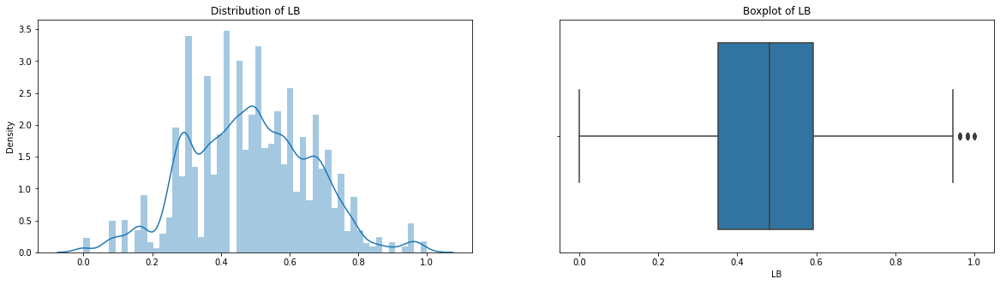

Variance of LB  0.030882135339584695


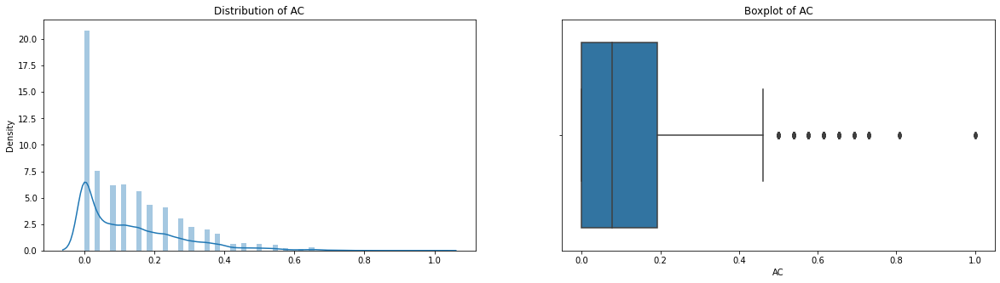

Variance of AC  0.02046993312294232


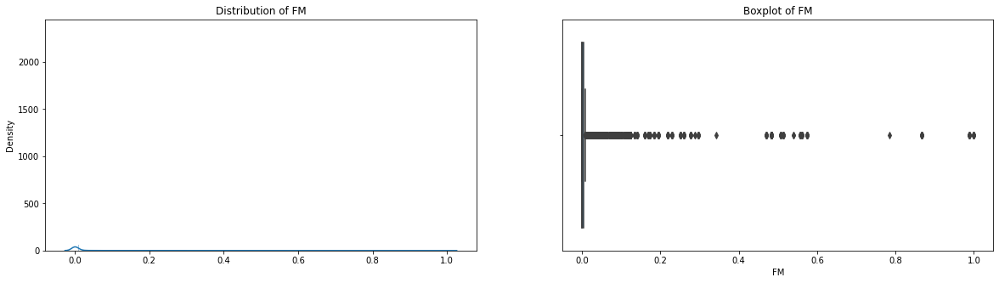

Variance of FM  0.0036617267417479024


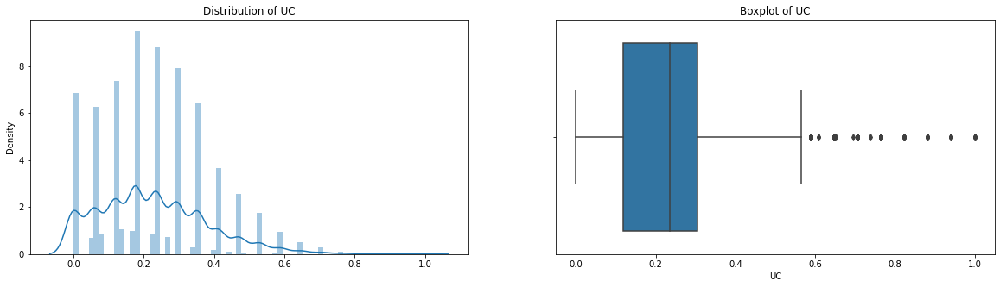

Variance of UC  0.024542406119677233


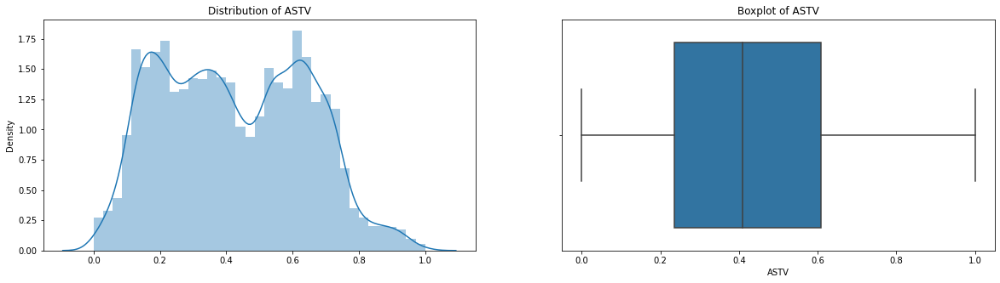

Variance of ASTV  0.047073046137078384


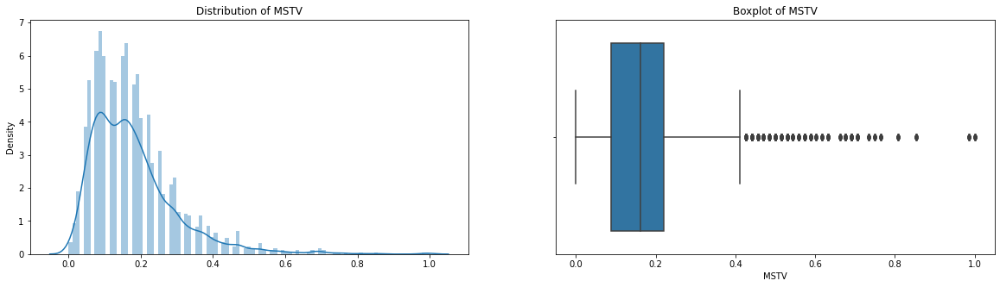

Variance of MSTV  0.014688136417202888


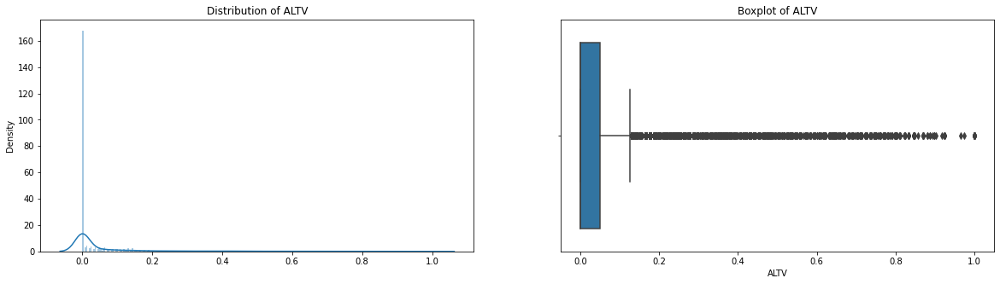

Variance of ALTV  0.021529057190125413


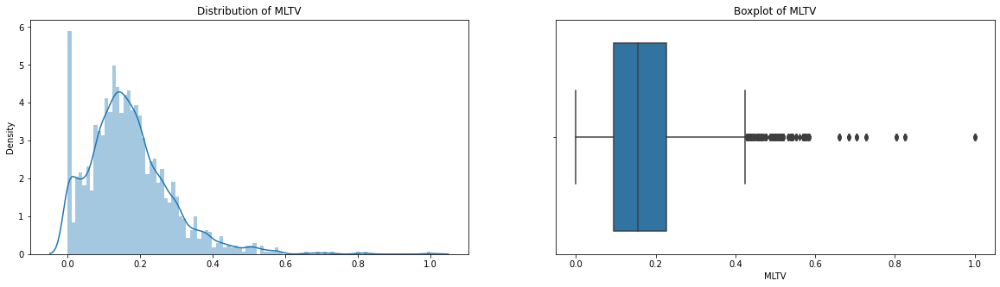

Variance of MLTV  0.013121190023127043


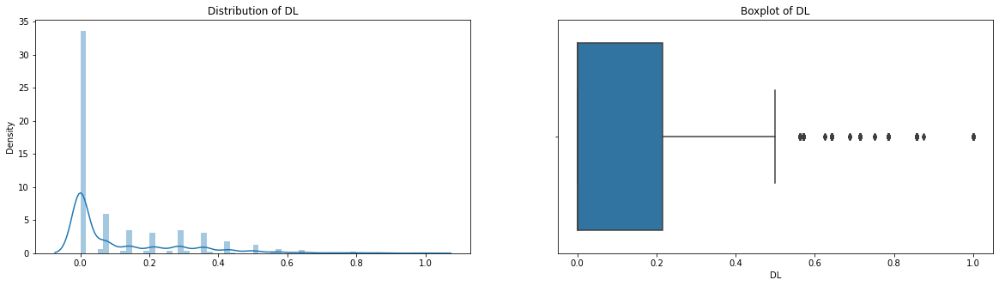

Variance of DL  0.029560055519280766


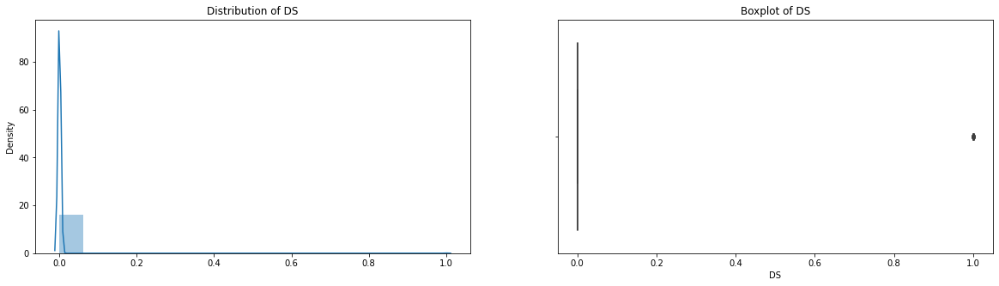

Variance of DS  0.0007695490611174859


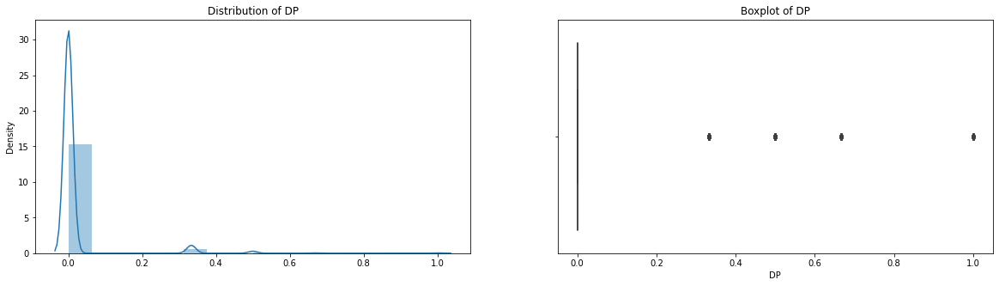

Variance of DP  0.007217051441389777


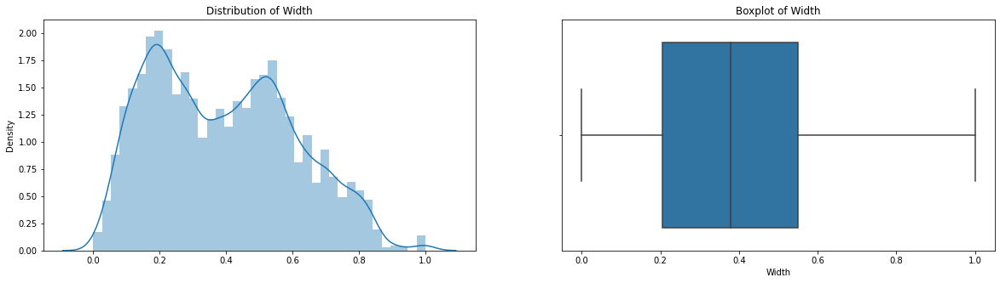

Variance of Width  0.04621889415397056


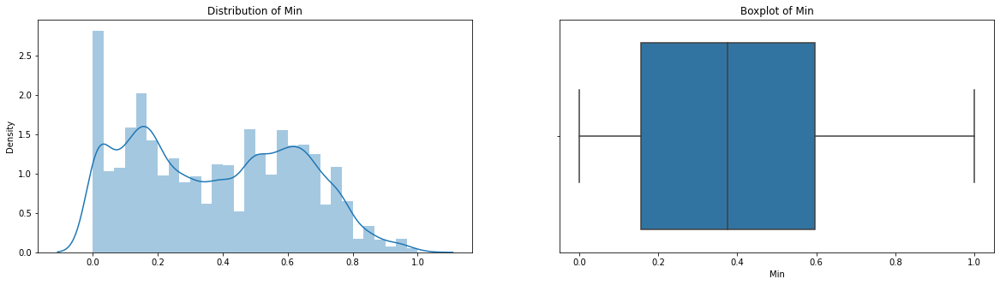

Variance of Min  0.06357440721692022


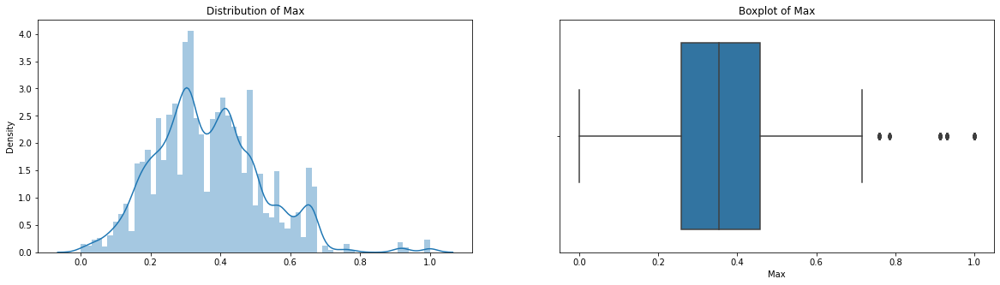

Variance of Max  0.02349482871290235


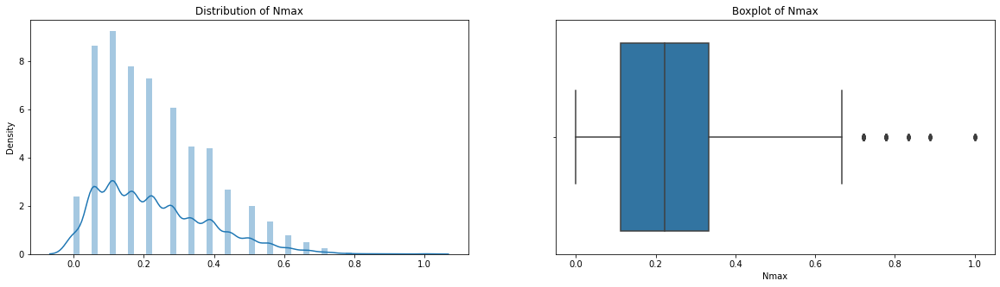

Variance of Nmax  0.025346508596841687


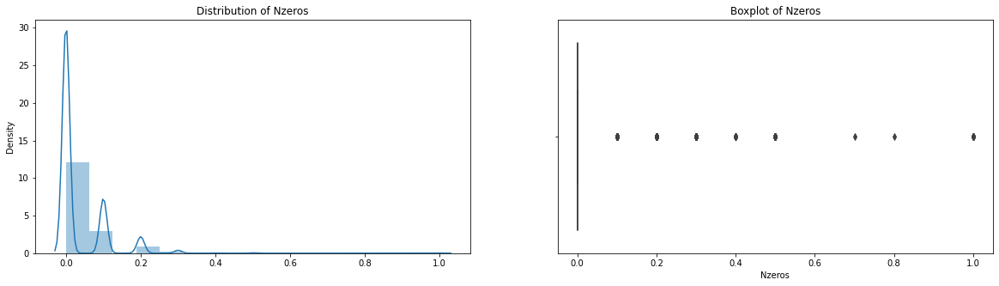

Variance of Nzeros  0.004789625120729279


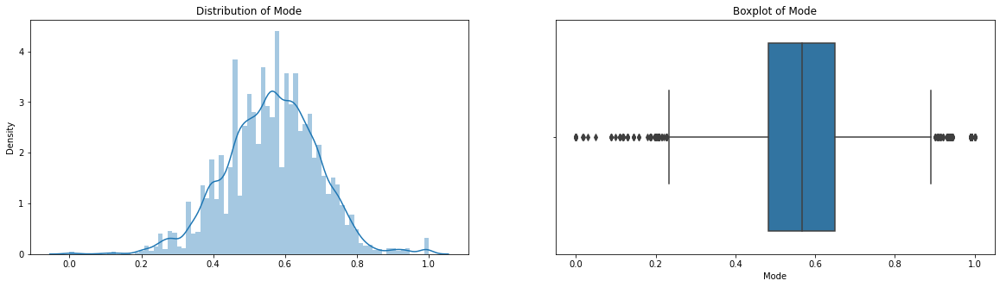

Variance of Mode  0.01649313250884576


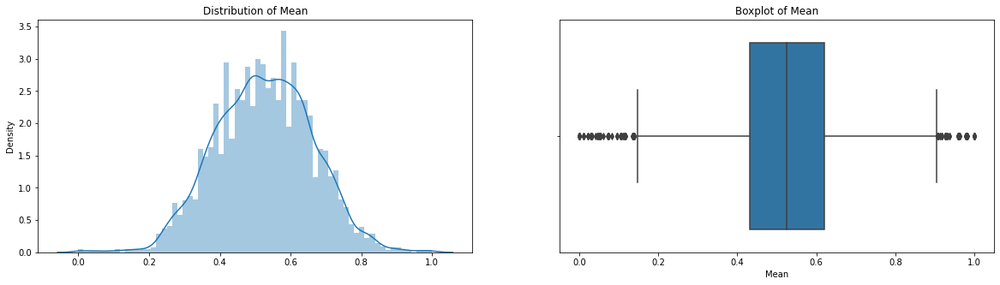

Variance of Mean  0.01859695468972909


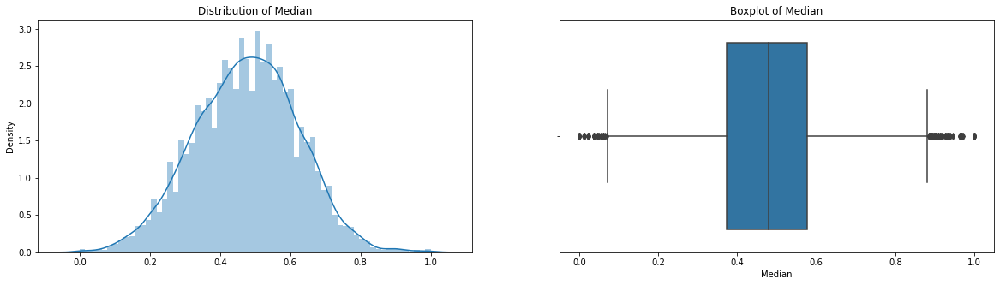

Variance of Median  0.02154613079883203


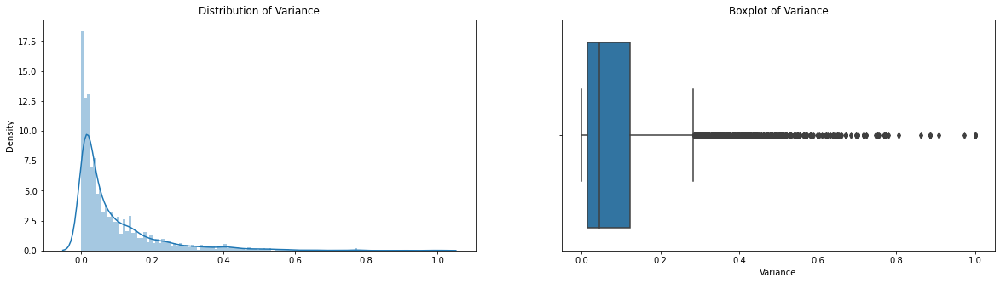

Variance of Variance  0.01433613844740452


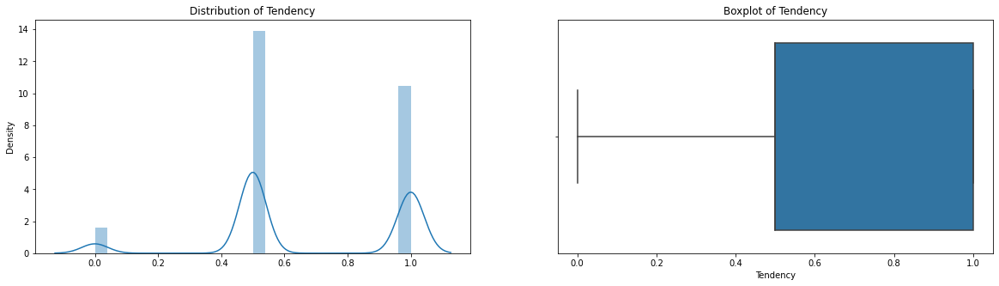

Variance of Tendency  0.0871209338008893


In [ ]:
for col in X:
  draw_distr(data[col], col)
  print(f'Variance of {col} ', np.var(data[col]))

### observations
1. Normal-like distributions: Mode, Mean, Median.
2. Distributions with little variance: FM, DS, PD, NZeros. --> maybe delete them on data preparation
3. Positive skewed distributions: AC,  MSTV, MLTV, DL, NMAX, Variance. --> map to normal distribution
4. Some distributions look like normal-like but have more than 1 mode: LB, ASTV, MLTV, Width, Min, Max. --> map to normal distribution
5. Some of the features seem to be discrete because of small number of unique values: DS, Dp, Nmax, Nzeros, Tendency.

## Muntivariate analysis

In [ ]:
 # to reduce number of features on pairplot to make it a little bit more readable
to_drop = ['FM', 'DS', 'PD', 'NZeros', 'Nmax', 'Tendency']
reduced_X = X[[col for col in X.columns  if col not in to_drop]] 

In [ ]:
# target encoding
y = y.map({"b'yes'": 1, "b'no'": 0})

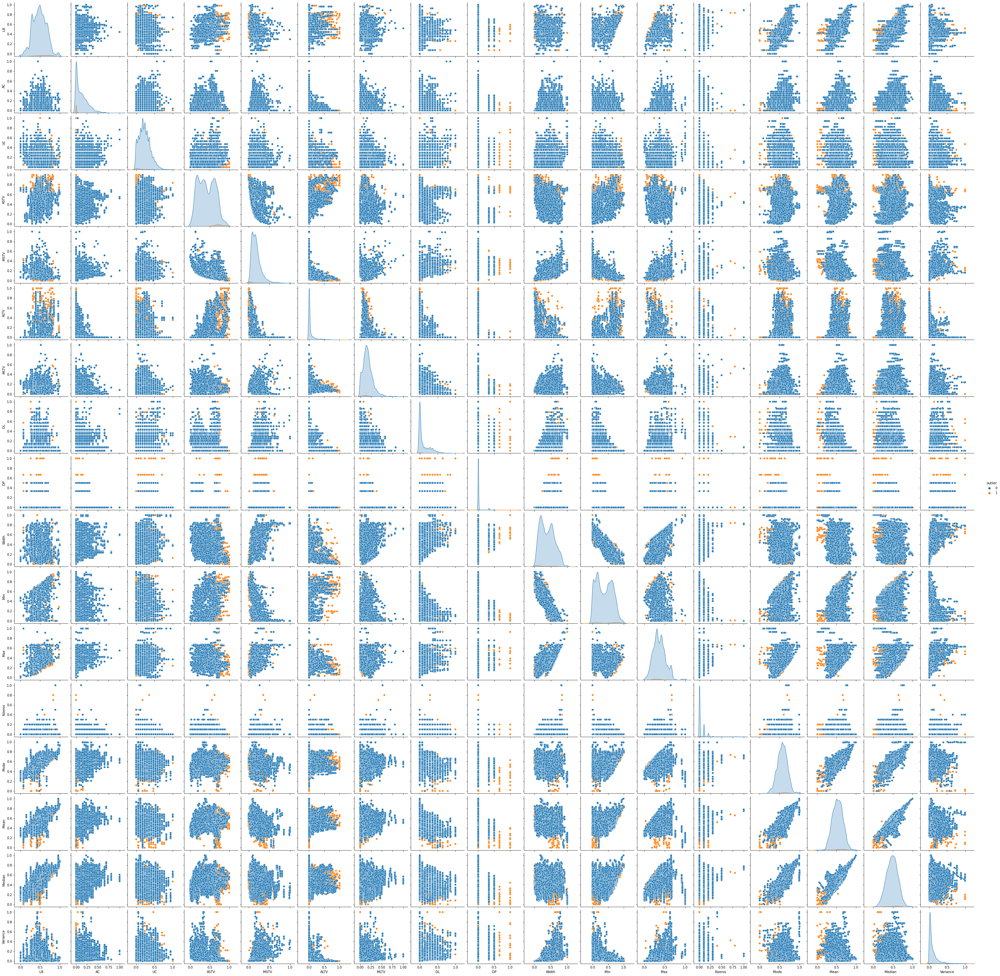

In [ ]:
sns.pairplot(pd.concat([reduced_X, y], axis=1), hue='outlier')

On some graphs, the distinction between target values is observable. For example, for outliers high DP values are typical. Same is for ALTV. But in most cases, there is no bif difference hue to target.  

Some of the feature seem to be co-correlated --> multicollinearity is observed

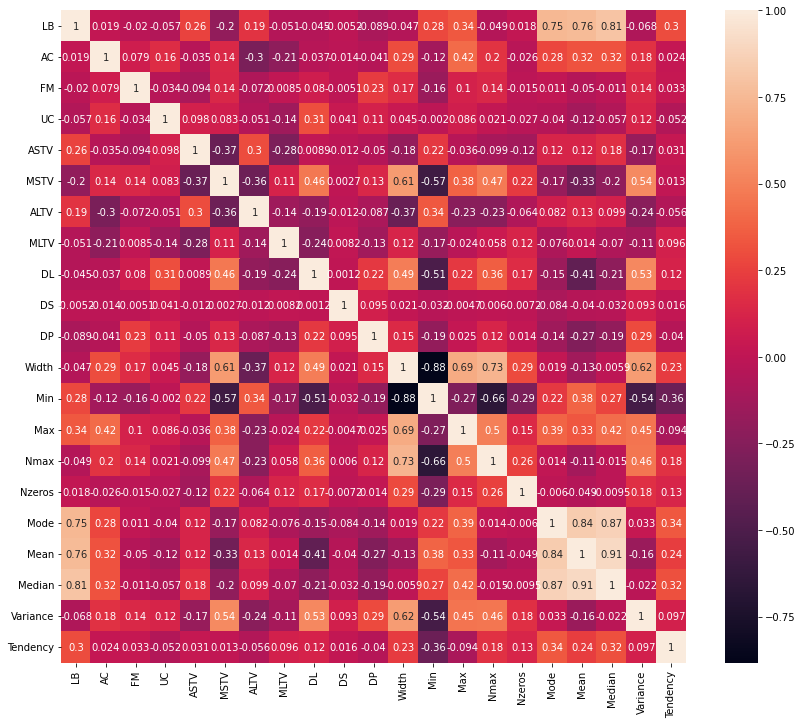

In [ ]:
data_corr = X.corr()
plt.figure(figsize=(14, 12))
sns.heatmap(data_corr, annot=True)
plt.show()

The observations from pairplot are proven.

The highest correlation is observed in Median-Mode-Mean features, which are correlated to LB, atthe same time.

So, as many of the features are correlated to any others, it seems to be impossible to delete some of them to reduce multicolliearity to minimum (except these 3 statistics: Median, Mode, Mean, 2 of them can be removed for sure)

The best of the available to me solutions are using regularizations where they are provided or dimentionality reduction techniques.

## Target Analysis

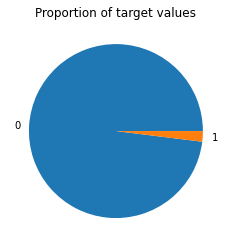

In [ ]:
plt.pie(y.value_counts(), labels=[0, 1])
plt.title('Proportion of target values')
plt.show()

The data is inbalanced.

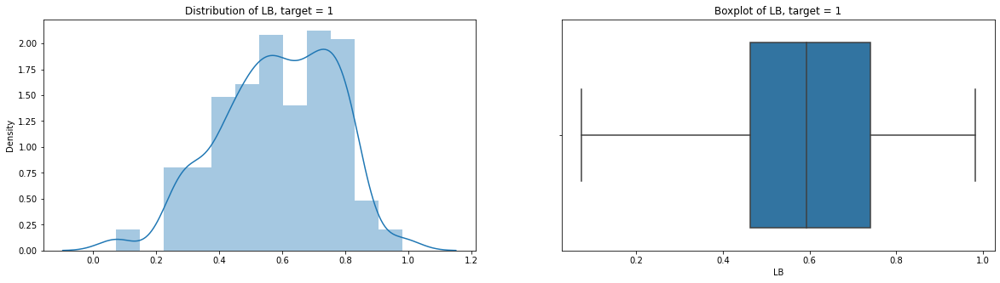

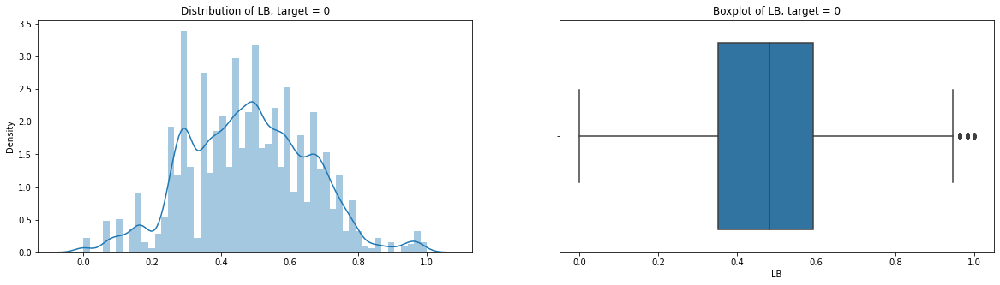

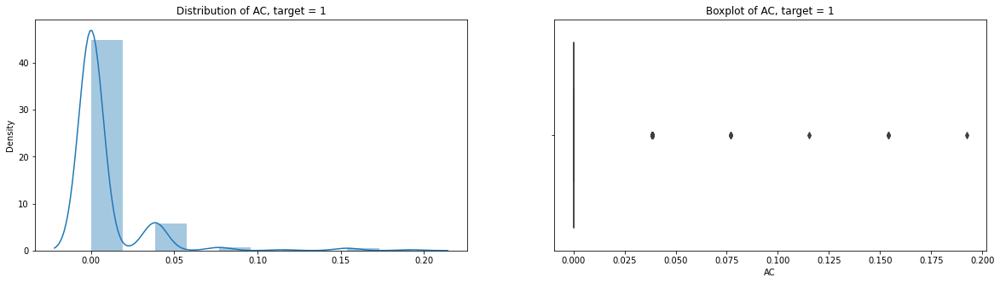

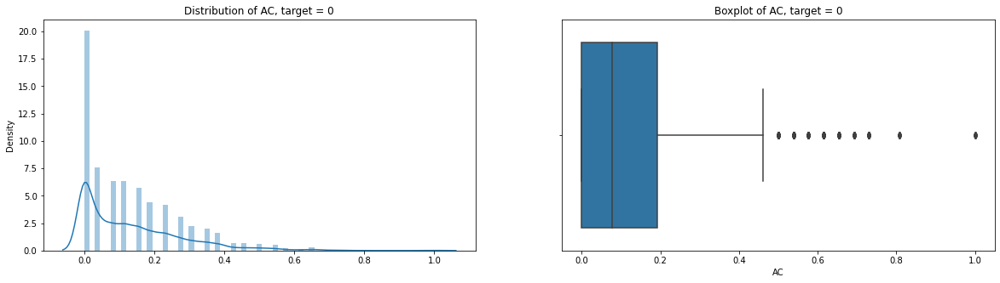

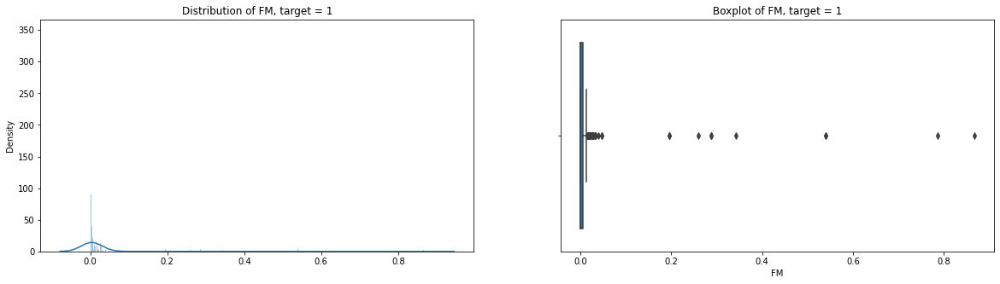

...

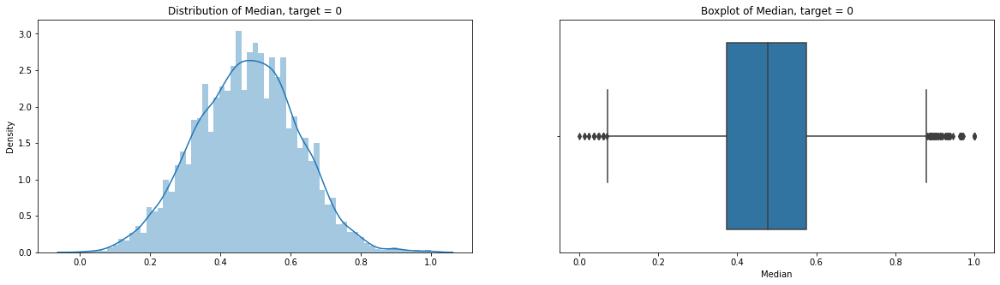

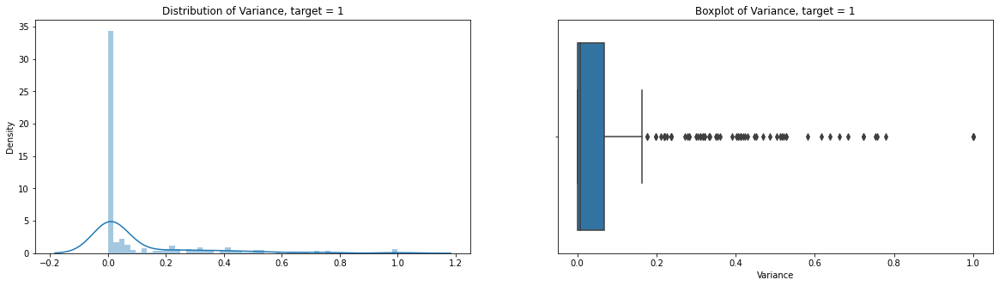

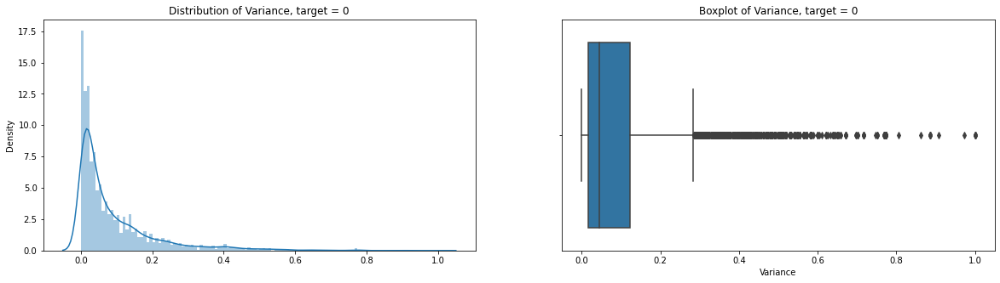

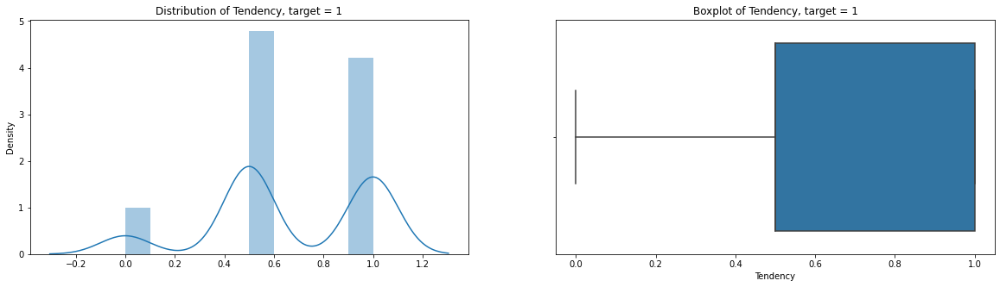

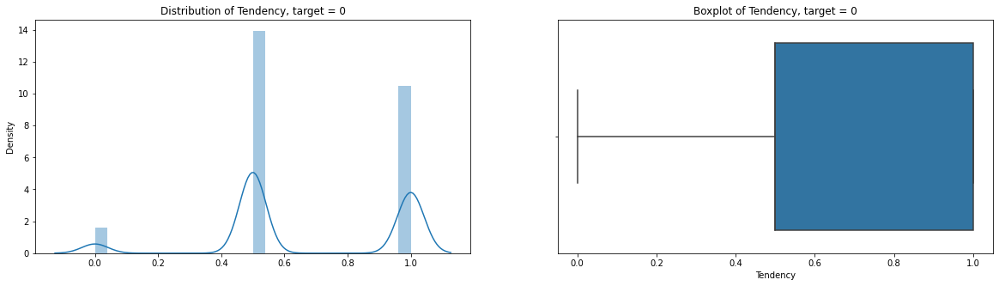

In [ ]:
# plotting feature distribution depending on target value
for col in X.columns:
  pos = X[y == 1][col]
  neg = X[y == 0][col]
  draw_distr(pos, f'{col}, target = 1')
  draw_distr(neg, f'{col}, target = 0')

Unlike to the pairplot, here the features distributions are different depending on the target value.
At the same time, it got clear that we can remove DS as it not only has almost 0 variance, but also doesn't depend on the target.

# Data Visualization

In [ ]:
def draw_2d_data(X_pca, y):
  plt.figure(figsize=(10, 6))
  plt.scatter(X_pca[0], X_pca[1], c=y, alpha=0.6)
  plt.title('X after PCA')
  plt.show()

In [ ]:
pca = PCA(n_components=2)
X_pca = pd.DataFrame(pca.fit_transform(X))

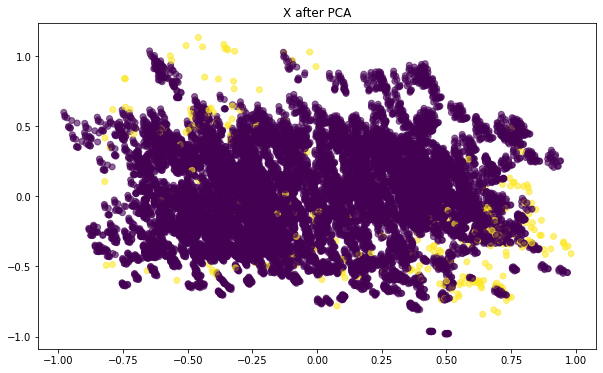

In [ ]:
draw_2d_data(X_pca, y)

The outliers are pretty scattered. We can see some outliers concentration in the left top corner and, in opposite, in the right lower corner. There are also some lonely flying red points across the blue cloud.

# Data Preparation

In [ ]:
# based on the eda step
X.drop(['Median', 'Mode'], axis=1, inplace=True)

In [ ]:
var_th = VarianceThreshold(threshold=0.001) # to remove feature with low variance
X_train, X_test, y_train, y_test = train_test_split(var_th.fit_transform(X),
                                                    y, test_size=0.33, random_state=0)

In [ ]:
log = FunctionTransformer(np.log1p) # to map to the normal distribution

\* as data is already scaled, we don't need to do it again.

\* there are also no missed values -- this step is skiped either.

In [ ]:
X_prep = pd.DataFrame(log.fit_transform(X))
pca = PCA(n_components=2)
X_prep_pca = pd.DataFrame(pca.fit_transform(X_prep))  # for plotting

X_train = pd.DataFrame(log.fit_transform(X_train))
pca = PCA(n_components=2)
X_train_pca = pd.DataFrame(pca.fit_transform(X_train))  # for plotting

X_test = pd.DataFrame(log.fit_transform(X_test))
pca = PCA(n_components=2)
X_test_pca = pd.DataFrame(pca.fit_transform(X_test))  # for plotting

y_train.index = X_train.index
y_test.index = X_test.index

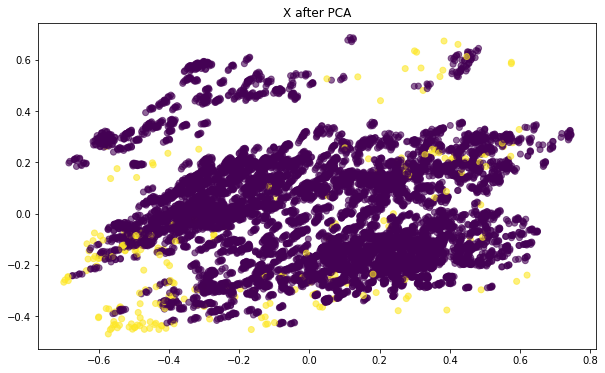

In [ ]:
draw_2d_data(X_train_pca, y_train)

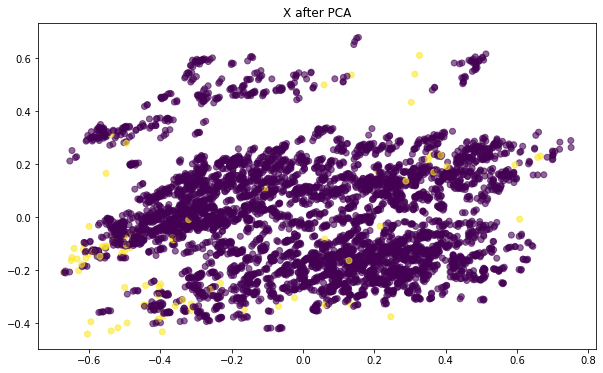

In [ ]:
draw_2d_data(X_test_pca, y_test)

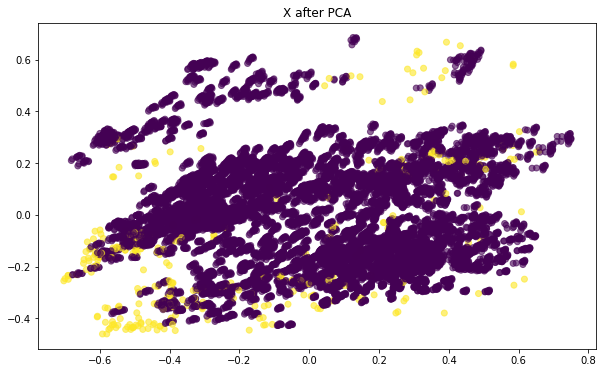

In [ ]:
draw_2d_data(X_prep_pca, y)

# Modeling

\* Metrics will be viewed after all models fitted and will be compared to each other

## Mahalanobis rule

In [ ]:
def mahalanobis(x=None, data=None, cov=None):

    x_mu = x - np.mean(data)
    if not cov:
        cov = np.cov(data.values.T)
    inv_covmat = np.linalg.inv(cov)
    left = np.dot(x_mu, inv_covmat)
    mahal = np.dot(left, x_mu.T)
    return mahal.diagonal()


def predict_outliers_mahalanobis(X):

  mah_dist = mahalanobis(x=X, data=X[X.columns])

  ps = 1 - chi2.cdf(mah_dist, 3)
  return [1 if p < 0.001 else 0 for p in ps]

In [ ]:
y_pred = predict_outliers_mahalanobis(X_prep)

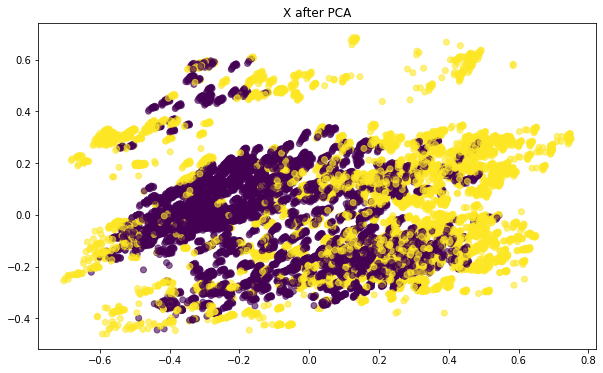

In [ ]:
draw_2d_data(X_prep_pca, y_pred)

In [ ]:
print(classification_report(y, y_pred))

              precision    recall  f1-score   support

           0       0.99      0.61      0.76     16550
           1       0.04      0.76      0.07       330

    accuracy                           0.61     16880
   macro avg       0.51      0.69      0.41     16880
weighted avg       0.97      0.61      0.74     16880



The results are far away from the perfect one: mahalanobis rule indicates to many ouliers compared to the real situation. It is clear from both the plot and the metrics.

## Supervised models

In [ ]:
def get_best_parameters(model, params, X, y):
  """
  runs RandomizedSearchCV to tune parameters
  """
  clf = model()
  search_cv = RandomizedSearchCV(clf, params)
  search_cv.fit(X, y)
  print('best_params:', search_cv.best_params_)

  return search_cv.best_params_

### SMV

In [ ]:
svc_parameters = {
      'C': [0.5, 0.8, 1.0],
      'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
      'degree': [2, 3, 4],
      'gamma': ['scale', 'auto'],
      'probability': [True]
    }
svc = SVC(**get_best_parameters(SVC, svc_parameters, X_train, y_train), random_state=0) # {'probability': True, 'kernel': 'poly', 'gamma': 'scale', 'degree': 3, 'C': 1.0}

best_params: {'probability': True, 'kernel': 'poly', 'gamma': 'scale', 'degree': 3, 'C': 1.0}


In [ ]:
svc.fit(X_train, y_train)

SVC(C=1.0, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='poly',
    max_iter=-1, probability=True, random_state=0, shrinking=True, tol=0.001,
    verbose=False)

In [ ]:
y_pred_svc = svc.predict(X_test)

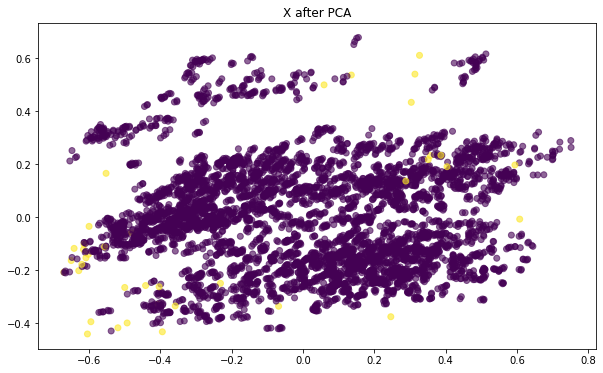

In [ ]:
draw_2d_data(X_test_pca, y_pred_svc)

This result seems to be much more close to the truth: I can see the same outliers patterns as they are in reality (in ne opposite corners), their numer also got closer to the truth, but now they are, on the contrary, in small numbers.they are less of outliers than it was expected.

### Logreg

In [ ]:
log_parameters = {
  'penalty': ['l1', 'l2', 'elasticnet', 'none'],
  'C': [0, 0.001, 0.01, 0.1, 1],
  'fit_intercept': [True, False],
  'class_weight': ['balanced', None]
  }
log = LogisticRegression(**get_best_parameters(LogisticRegression, log_parameters, X_train, y_train), random_state=0)
log.fit(X_train, y_train)

best_params: {'penalty': 'none', 'fit_intercept': False, 'class_weight': None, 'C': 0}


LogisticRegression(C=0, class_weight=None, dual=False, fit_intercept=False,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='none',
                   random_state=0, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [ ]:
y_pred_log = log.predict(X_test)

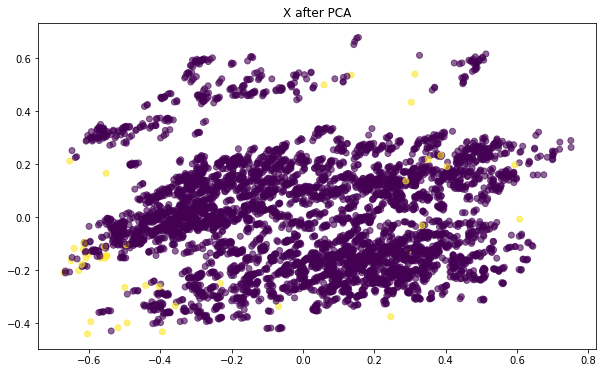

In [ ]:
draw_2d_data(X_test_pca, y_pred_log)

This plot is similar to the previous one, but there are even fewer of outliers.

### KNN

In [ ]:
knn_parameters = {
  'n_neighbors': [2, 3, 5, 8, 10, 15],
  'weights': ['uniform', 'distance'],
  'leaf_size': [10, 15, 20, 30, 40]
  }
knn = KNeighborsClassifier(**get_best_parameters(KNeighborsClassifier, knn_parameters, X_train, y_train))
knn.fit(X_train, y_train)

best_params: {'weights': 'distance', 'n_neighbors': 5, 'leaf_size': 40}


KNeighborsClassifier(algorithm='auto', leaf_size=40, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='distance')

In [ ]:
y_pred_knn = knn.predict(X_test)

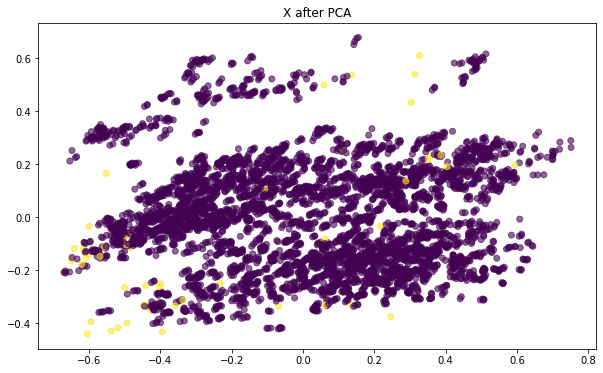

In [ ]:
draw_2d_data(X_test_pca, y_pred_knn)

this is also clode to the svc and logreg. No much differences are visually noticable.

## Unsupervised models

### One-Class SVM

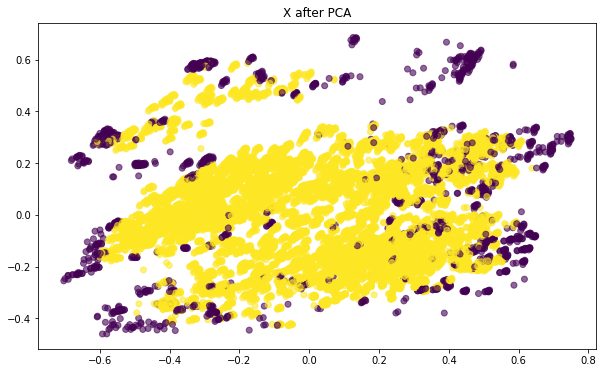

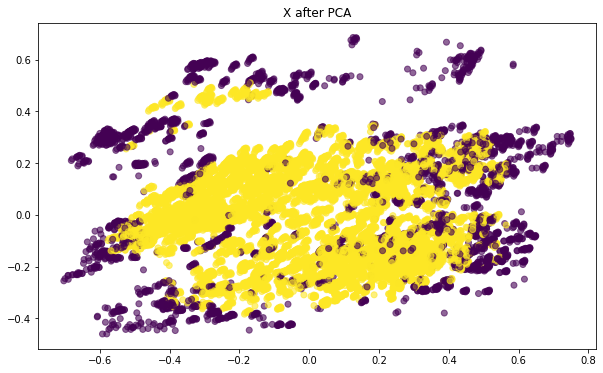

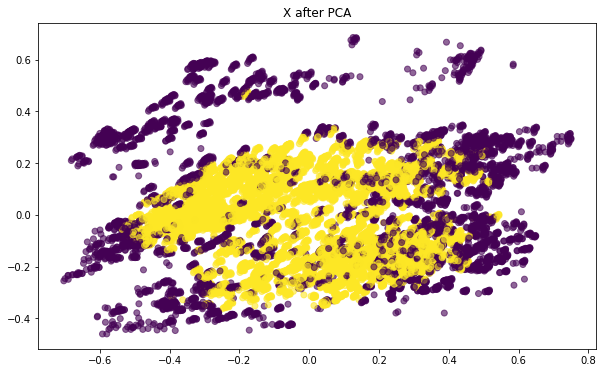

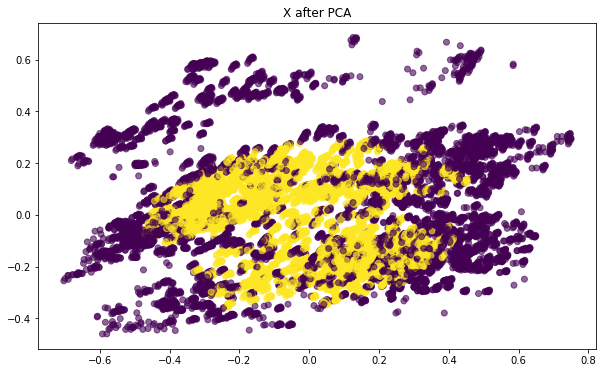

In [ ]:
for nu in [0.1, 0.2, 0.35, 0.5]:
  print('nu =', nu)
  detector = OneClassSVM(nu=nu)
  y_pred_svm = detector.fit_predict(X_prep)
  draw_2d_data(X_prep_pca, y_pred_svm)

The results of the algorithm for different parameter's values do not reflect the pattern of the location of outliers in reality.

### Isolation forest

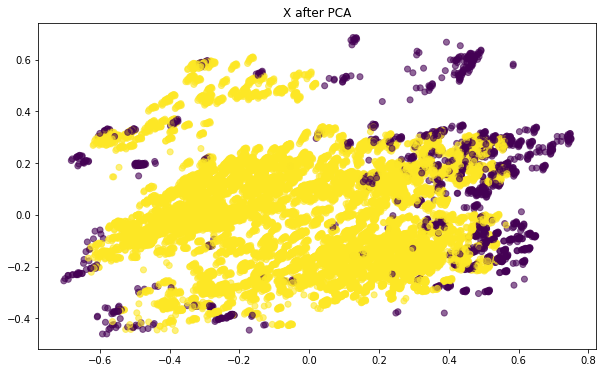

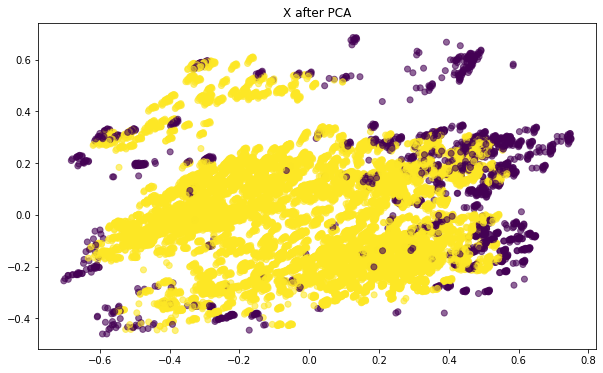

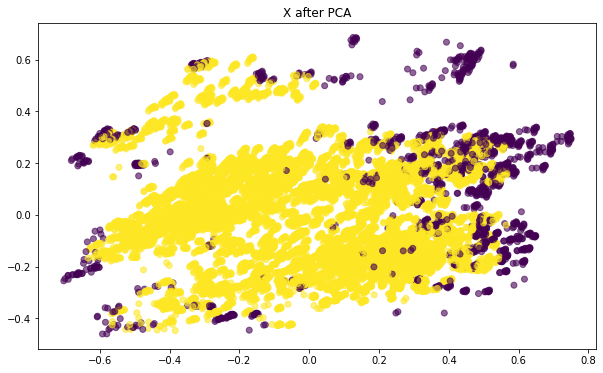

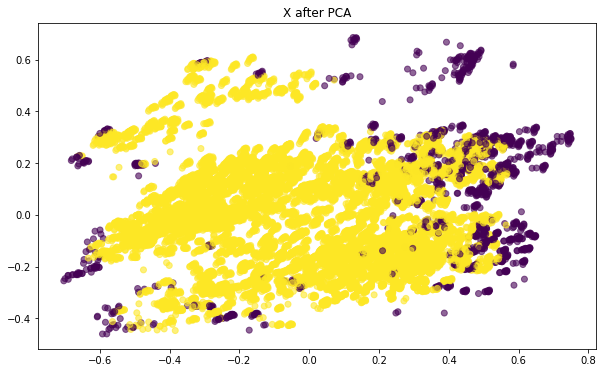

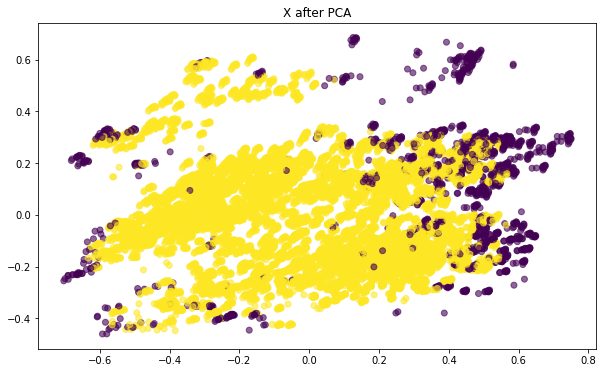

In [ ]:
for n in [100, 200, 30, 400, 50]:
  print('n_components =', n)
  iso_forest = IsolationForest(n_estimators=400)
  y_pred_iso = iso_forest.fit_predict(X_prep)
  draw_2d_data(X_prep_pca, y_pred_iso)

Same as for the One-Class SVM: The results of the algorithm for different parameter values do not reflect the pattern of the location of outliers in reality.

# Models comparison

As the data is unbalanced, it seems to be wise to use f1-score (and recall, precision aswell) as metrics to evaluate the models.

I would like also to see roc-auc, but not all of th models provide probabilities.

In [ ]:
print('            =-=-=-=-=-Supervised=-=-=-=-=')

print('=====SVM=====')
print(classification_report(y_test, y_pred_svc))

print('=====LogReg=====')
print(classification_report(y_test, y_pred_log))

print('=====KNN=====')
print(classification_report(y_test, y_pred_knn))

print('\n            =-=-=-=-=-Unsupervised=-=-=-=-=')

print('====One-Class SVM====')
print(classification_report(y, pd.Series(y_pred_svm).map({-1: 0, 1: 1})))

print('====Isolation Forest====')
print(classification_report(y, pd.Series(y_pred_iso).map({-1: 0, 1: 1})))

            =-=-=-=-=-Supervised=-=-=-=-=
=====SVM=====
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      4988
           1       1.00      0.45      0.62        76

    accuracy                           0.99      5064
   macro avg       1.00      0.72      0.81      5064
weighted avg       0.99      0.99      0.99      5064

=====LogReg=====
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      4988
           1       0.78      0.42      0.55        76

    accuracy                           0.99      5064
   macro avg       0.89      0.71      0.77      5064
weighted avg       0.99      0.99      0.99      5064

=====KNN=====
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      4988
           1       0.94      0.82      0.87        76

    accuracy                           1.00      5064
   macro avg       0.97      0.91      0.

Overall, the supervised algorithm  did much better than the unsupervised ones. It is clear from both the metrics and the plots.

Among the supervised algorithms, KNN did the best job. SVC is on the second place, LogReg -- on the third. However, the metric of each supervised algorithms are higher than for any unsupervised one.

 Way out in front, One-class SVM leans among the unsupervised algorithms.

The biggest mistake for many unsuccessful algorithms here is that they assign to many samples to the outliers.

The pattern of outliers' location is not obvious. No wonder that all unsurevised techniques could not catch it.